# Tune post-processing & small mIoU parameters

In [1]:
%run post_processing_functions.ipynb

In [2]:
# Load images
base_dir = '/oak/stanford/groups/deho/building_compliance/'
inferences = glob.glob('{}rgb-footprint-extract/small_mIOU_testing/*.npy'.format(base_dir))
file_names = [f.split(os.path.sep)[-1] for f in inferences]

images = np.zeros((len(inferences), 1024, 1024, 3), dtype=np.int32)
masks = np.zeros((len(inferences) + 1, 1024, 1024), dtype=np.int32)
pred_images = np.zeros((len(inferences) + 1, 1024, 1024), dtype=np.int32)

for i, f in enumerate(file_names):
    # Inference
    pred_images[i, :] = np.load(inferences[i])
    
    # Gt image
    img_file = '{}san_jose_naip_512/phase2_superresx2/train/images/{}'.format(base_dir, f)
    images[i, :] = np.load(img_file)
    
    # Mask
    mask_file = '{}san_jose_naip_512/phase2_superresx2/train/masks/{}'.format(base_dir, f.replace('.npy', '_mask.npy'))
    masks[i, :] = np.load(mask_file)

## 1. Post-processing

Building separation

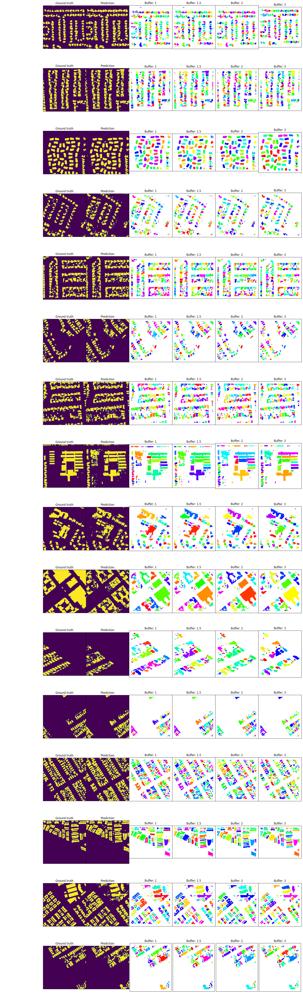

In [3]:
offset = 0
buffer_vals=[1, 1.5, 2, 3]

fig, axs = plt.subplots(nrows=16, ncols=1, figsize=(20, 60))
#fig, axs = plt.subplots(nrows=8, ncols=1)
fig.suptitle('Samples')

for ax in axs:
    ax.remove()

# add subfigure per subplot
gridspec = axs[0].get_subplotspec().get_gridspec()
subfigs = [fig.add_subfigure(gs) for gs in gridspec]    

for row, subfig in enumerate(subfigs):
    row += offset
    
    # Get images
    file_name = file_names[row].replace('.npy', '')
    pred_image = pred_images[row, :]
    mask = masks[row, :]
    gt_image = (mask > 0).astype(np.int32)
    
    # Get GPD
    buildings_gpd = get_footprint_gpd(mask=pred_image, file_name=file_name, size=pred_image.shape[0])
    
    # Plot
    subfig.suptitle('')
    (axs) = subfig.subplots(nrows=1, ncols=2 + len(buffer_vals))
    
    for ax in list(axs):
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

    axs[0].set_title('Ground truth')
    axs[0].imshow(gt_image)
    axs[1].set_title('Prediction')
    axs[1].imshow(pred_image)
    
    for i, buffer_val in enumerate(buffer_vals):
        # Separate buildings
        inferred_buildings = separate_buildings(buildings_gpd=buildings_gpd, buffer_val=buffer_val)
        inferred_buildings['idx'] = np.random.randint(0, 1000, size=len(inferred_buildings))

        axs[i+2].set_title('Buffer: {}'.format(buffer_val))
        axs[i+2] = inferred_buildings.plot(ax=axs[i+2], column='idx', cmap='gist_rainbow')

    plt.subplots_adjust(wspace=0, hspace=0)


plt.show()

Road filtering

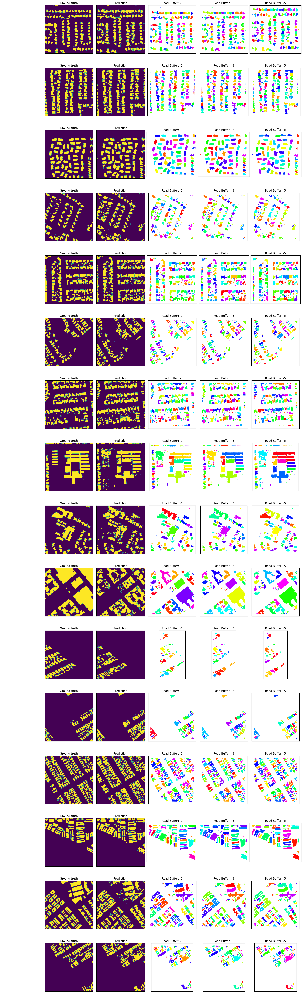

In [3]:
offset = 0
buffer_val = 2
road_buffers = [-1, -3, -5]


fig, axs = plt.subplots(nrows=16, ncols=1, figsize=(20, 60))
fig.suptitle('Samples')

for ax in axs:
    ax.remove()

# add subfigure per subplot
gridspec = axs[0].get_subplotspec().get_gridspec()
subfigs = [fig.add_subfigure(gs) for gs in gridspec]    

for row, subfig in enumerate(subfigs):
    row += offset
    
    # Get images
    file_name = file_names[row].replace('.npy', '')
    pred_image = pred_images[row, :]
    mask = masks[row, :]
    gt_image = (mask > 0).astype(np.int32)
    
    # Get GPD
    buildings_gpd = get_footprint_gpd(mask=pred_image, file_name=file_name, size=pred_image.shape[0])
    
    # Plot
    subfig.suptitle('')
    (axs) = subfig.subplots(nrows=1, ncols=2 + len(road_buffers))
    
    for ax in list(axs):
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

    axs[0].set_title('Ground truth')
    axs[0].imshow(gt_image)
    axs[1].set_title('Prediction')
    axs[1].imshow(pred_image)
    
    for i, road_buffer in enumerate(road_buffers):
        # Separate buildings
        inferred_buildings = separate_buildings(buildings_gpd=buildings_gpd, buffer_val=buffer_val)
        inferred_buildings['idx'] = np.random.randint(0, 1000, size=len(inferred_buildings))
        inferred_buildings = filter_roads(buildings_gpd=inferred_buildings, file_name=file_name, road_buffer=road_buffer)
    

        axs[i+2].set_title('Road Buffer: {}'.format(road_buffer))
        axs[i+2] = inferred_buildings.plot(ax=axs[i+2], column='idx', cmap='gist_rainbow')

    plt.subplots_adjust(wspace=0, hspace=0)


plt.show()

Upper and lower bound prediction size

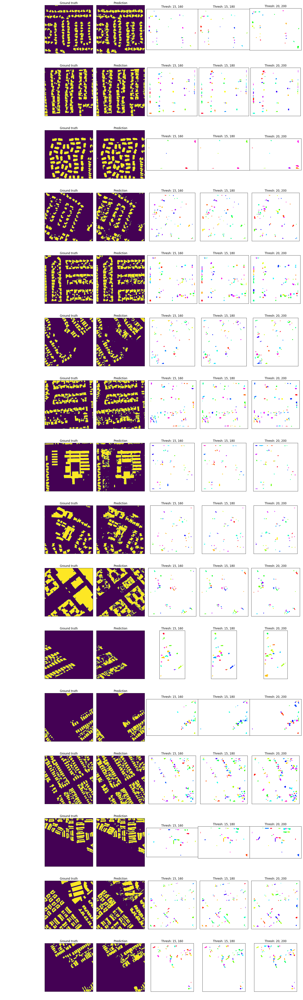

In [3]:
offset = 0
buffer_val = 2
road_buffer = -5

area_thresh = [(15, 160), (15, 180), (20, 200)]


fig, axs = plt.subplots(nrows=16, ncols=1, figsize=(20, 60))
fig.suptitle('Samples')

for ax in axs:
    ax.remove()

# add subfigure per subplot
gridspec = axs[0].get_subplotspec().get_gridspec()
subfigs = [fig.add_subfigure(gs) for gs in gridspec]    

for row, subfig in enumerate(subfigs):
    row += offset
    
    # Get images
    file_name = file_names[row].replace('.npy', '')
    pred_image = pred_images[row, :]
    mask = masks[row, :]
    gt_image = (mask > 0).astype(np.int32)
    
    # Get GPD
    buildings_gpd = get_footprint_gpd(mask=pred_image, file_name=file_name, size=pred_image.shape[0])
    
    # Plot
    subfig.suptitle('')
    (axs) = subfig.subplots(nrows=1, ncols=2 + len(area_thresh))
    
    for ax in list(axs):
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

    axs[0].set_title('Ground truth')
    axs[0].imshow(gt_image)
    axs[1].set_title('Prediction')
    axs[1].imshow(pred_image)
    
    for i, (small_area_thresh, large_area_thresh) in enumerate(area_thresh):
        # Separate buildings
        inferred_buildings = separate_buildings(buildings_gpd=buildings_gpd, buffer_val=buffer_val)
        inferred_buildings['idx'] = np.random.randint(0, 1000, size=len(inferred_buildings))
        inferred_buildings = filter_roads(buildings_gpd=inferred_buildings, file_name=file_name, road_buffer=road_buffer)
    
        # Filter out predictions that are too small
        inferred_buildings = filter_buildings_area(
            buildings_gpd=inferred_buildings, area_thresh=small_area_thresh, larger_than=True)
    
        # Filter for small buildings
        inferred_buildings = filter_buildings_area(
            buildings_gpd=inferred_buildings, area_thresh=large_area_thresh, larger_than=False)
    

        axs[i+2].set_title('Thresh: {}, {}'.format(small_area_thresh, large_area_thresh))
        axs[i+2] = inferred_buildings.plot(ax=axs[i+2], column='idx', cmap='gist_rainbow')

    plt.subplots_adjust(wspace=0, hspace=0)


plt.show()

## 2. Small mIoU

[INFO]: 0/16
[INFO]: 1/16
[INFO]: 2/16
[INFO]: 3/16
[INFO]: 4/16
[INFO]: 5/16
[INFO]: 6/16
[INFO]: 7/16
[INFO]: 8/16
[INFO]: 9/16
[INFO]: 10/16
[INFO]: 11/16
[INFO]: 12/16
[INFO]: 13/16
[INFO]: 14/16
[INFO]: 15/16


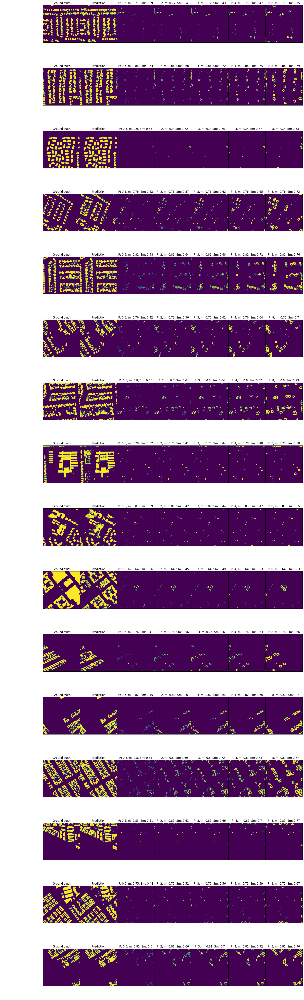

In [4]:
offset = 0
buffer_val = 2
road_buffer = -5
small_area_thresh = 15
large_area_thresh = 160
small_paddings = [0.5, 2, 3, 4, 8]

fig, axs = plt.subplots(nrows=16, ncols=1, figsize=(20, 60))
fig.suptitle('Samples')

for ax in axs:
    ax.remove()

# add subfigure per subplot
gridspec = axs[0].get_subplotspec().get_gridspec()
subfigs = [fig.add_subfigure(gs) for gs in gridspec]    

for row, subfig in enumerate(subfigs):
    print('[INFO]: {}/{}'.format(row, 16))
    row += offset
    
    # Get images
    file_name = file_names[row].replace('.npy', '')
    pred_image = pred_images[row, :]
    mask = masks[row, :]
    gt_image = (mask > 0).astype(np.int32)
    gt_area = mask
    
    # Get GPD
    buildings_gpd = get_footprint_gpd(mask=pred_image, file_name=file_name, size=pred_image.shape[0])
    
    # Plot
    subfig.suptitle('')
    (axs) = subfig.subplots(nrows=1, ncols=2 + len(small_paddings))
    
    for ax in list(axs):
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

    axs[0].set_title('Ground truth')
    axs[0].imshow(gt_image)
    axs[1].set_title('Prediction')
    axs[1].imshow(pred_image)
    
    for i, small_padding in enumerate(small_paddings):
        # Separate buildings
        #inferred_buildings = separate_buildings(buildings_gpd=buildings_gpd, buffer_val=buffer_val)
        #inferred_buildings['idx'] = np.random.randint(0, 1000, size=len(inferred_buildings))
        #inferred_buildings = filter_roads(buildings_gpd=inferred_buildings, file_name=file_name, road_buffer=road_buffer)
    
        # Filter out predictions that are too small
        #inferred_buildings = filter_buildings_area(
        #    buildings_gpd=inferred_buildings, area_thresh=small_area_thresh, larger_than=True)
    
        # Filter for small buildings
        #inferred_buildings = filter_buildings_area(
        #    buildings_gpd=inferred_buildings, area_thresh=large_area_thresh, larger_than=False)
        
        std_miou = mIOU_manual(gt_image=gt_image, pred_image=pred_image)

        smiou, maps = small_mIOU(gt_image=gt_image, pred_image=pred_image, gt_area=gt_area, 
                        file_name=file_name, pad_buffer=small_padding, buffer_val=buffer_val, 
                       small_area_thresh=small_area_thresh, large_area_thresh=large_area_thresh, 
                                 road_buffer=road_buffer)
    
        axs[i+2].set_title('P: {}, m: {}, Sm: {}'.format(small_padding, 
                                                                     round(std_miou, 2), round(smiou, 2)))
        axs[i+2].imshow(maps['class_0_gt'])
        #axs[i+2].imshow(maps['class_0_pred'])

    plt.subplots_adjust(wspace=0, hspace=0)


plt.show()